In [119]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import randint, uniform

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, OneHotEncoder

from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import LabelEncoder
from sklearn.pipeline import Pipeline
from sklearn.compose import make_column_selector

from sklearn.ensemble import RandomForestClassifier
from xgboost import XGBClassifier
from lightgbm import LGBMClassifier
from catboost import CatBoostClassifier

from sklearn.model_selection import cross_val_score, RandomizedSearchCV
from sklearn.metrics import recall_score, f1_score, balanced_accuracy_score

from sklearn.model_selection import learning_curve

import pickle

In [120]:
project_accidents_df = pd.read_csv('../data/agg_df.csv')
project_accidents_df.shape

(65093, 24)

In [121]:
project_accidents_df = project_accidents_df.sample(20000, random_state=42)

In [122]:
pd.set_option('display.max_columns', None)
project_accidents_df.head()

,accident_number,date,day_of_week,hour,road_category,road_layout,num_lanes,reserved_lane,road_profile,road_shape,surface_condition,infrastructure,road_location,speed_limit,injury_severity,users_involved,light_conditions,department,urban_area,intersection_type,weather,collision_type,latitude,longitude
41737,202100032450,2021-06-24,Thursday,15,Local & Access Roads,One Way,1,No value,Flat,Straight,Normal,No value,Road,30,4,2,Day,Val-d'Oise,Inside urban area,No junction,Normal Visibility,Multi-car collision,49.049450,2.032880
22819,202000016243,2020-10-19,Monday,8,Local & Access Roads,Two Way,2,No value,Flat,Straight,Normal,No value,Road,30,4,2,Day,Val-de-Marne,Inside urban area,No junction,Normal Visibility,Multi-car collision,48.841776,2.519453
36105,202100012477,2021-10-18,Monday,20,Local & Access Roads,Two Way,2,Cycle Lane,Flat,Curved,Wet / Slippery,No value,Cyclist / Pedestrian,30,4,2,Night,Paris,Inside urban area,Simple junction,Reduced Traction,2-car collision,48.895271,2.371927
63769,202300050339,2023-08-25,Friday,18,Secondary Roads,One Way,2,Reserved Lane,Flat,Straight,Normal,Other,Reserved Lanes,50,4,4,Day,Val-de-Marne,Inside urban area,No junction,Normal Visibility,2-car collision,48.776780,2.441350
42561,202100035188,2021-06-11,Friday,17,Major Roads,One Way,3,No value,Flat,Straight,Normal,No value,Road,110,4,5,Day,Essonne,Outside urban area,No junction,Normal Visibility,Multi-car collision,48.698130,2.314190


In [123]:
project_accidents_df.injury_severity.value_counts(normalize=True)

injury_severity
4    0.8946
3    0.0933
2    0.0121
Name: proportion, dtype: float64

In [ ]:
project_accidents_df.columns


Index(['accident_number', 'date', 'day_of_week', 'hour', 'road_category',
       'road_layout', 'num_lanes', 'reserved_lane', 'road_profile',
       'road_shape', 'surface_condition', 'infrastructure', 'road_location',
       'speed_limit', 'injury_severity', 'users_involved', 'light_conditions',
       'department', 'urban_area', 'intersection_type', 'weather',
       'collision_type', 'latitude', 'longitude'],
      dtype='object')

In [125]:
X = project_accidents_df.drop(columns=['injury_severity','date', 'latitude', 'longitude', 'department'])
y = project_accidents_df['injury_severity']

le = LabelEncoder()
y = le.fit_transform(y)

In [126]:
np.unique(y, return_counts=True)

(array([0, 1, 2]), array([  242,  1866, 17892]))

In [127]:
X.shape, y.shape

((20000, 19), (20000,))

In [128]:
X_train, X_test, y_train, y_test = train_test_split(
    X,
    y,
    test_size=0.2,
    random_state=42,
    stratify=y
)

In [129]:
X_train.shape, X_test.shape, y_train.shape, y_test.shape

((16000, 19), (4000, 19), (16000,), (4000,))

In [130]:
# # 💡 I will skip Oversampling step as bosting algorithms can handle imbalanced data well.
# smote = SMOTE(random_state=42)
# X_train, y_train = smote.fit_resample(X_train, y_train)
# X_train.shape, y_train.shape

In [131]:
num_col = make_column_selector(dtype_include=['int64', 'float64'])
cat_col = make_column_selector(dtype_include=['object'])


num_transformer = Pipeline([
    ('standard_scaler', StandardScaler())
])

cat_transformer = OneHotEncoder(handle_unknown='ignore')

preprocessor= ColumnTransformer([
    ('num_transformer', num_transformer, num_col),
    ('cat_transformer', cat_transformer, cat_col)
])
preprocessor

ColumnTransformer(transformers=[('num_transformer',
                                 Pipeline(steps=[('standard_scaler',
                                                  StandardScaler())]),
                                 <sklearn.compose._column_transformer.make_column_selector object at 0x144fb36e0>),
                                ('cat_transformer',
                                 OneHotEncoder(handle_unknown='ignore'),
                                 <sklearn.compose._column_transformer.make_column_selector object at 0x144fb0650>)])

---

## Baseline

In [132]:
baseline = (1 + 0 + 0) / 3
baseline

0.3333333333333333

📝 Baseline score is **0.33**

## Modeling

### Default Random Forest

In [133]:
# Random Forest　Pipeline
pipeline_forest = Pipeline([
    ('preprocess', preprocessor),
    ('forest', RandomForestClassifier(random_state=42))
])

cv_results_forest = cross_val_score(pipeline_forest, X_train, y_train, cv=10, scoring='f1_macro').mean()
cv_results_forest

0.3228342677030983

### Optimize Random Forest

In [134]:
params = {
    'forest__n_estimators': randint(50, 300),
    'forest__max_depth': randint(3, 20),
    'forest__min_samples_split': randint(2, 20),
    'forest__min_samples_leaf': randint(1, 10),
    'forest__max_features': ['sqrt', 'log2', None],
    'forest__bootstrap': [True, False],
}

search_forest = RandomizedSearchCV(
                        pipeline_forest,
                        params,
                        n_iter=30,
                        n_jobs=-1,
                        cv=5,
                        scoring='f1_macro',
                        verbose=1,
                        random_state=42)

search_forest.fit(X_train,y_train)
search_forest.best_params_

Fitting 5 folds for each of 30 candidates, totalling 150 fits


{'forest__bootstrap': False,
 'forest__max_depth': 18,
 'forest__max_features': None,
 'forest__min_samples_leaf': 3,
 'forest__min_samples_split': 13,
 'forest__n_estimators': 104}

In [135]:
best_pipeline_forest = search_forest.best_estimator_

cv_results_forest = cross_val_score(best_pipeline_forest, X_train, y_train, cv=10, scoring='f1_macro').mean()
cv_results_forest

0.3431016249874722

### Default XGBoost

In [136]:
# XGBoost Pipeline
pipeline_xgb = Pipeline([
    ('preprocess', preprocessor),
    ('xgb', XGBClassifier(
        objective='multi:softmax',
        num_class=3,
        random_state=42,
        n_jobs=-1
    ))
])

cv_results_xgb = cross_val_score(pipeline_xgb, X_train, y_train, cv=10, scoring='f1_macro').mean()
cv_results_xgb

0.33296799600878957

### Optimize XGBoost

In [137]:
params = {
    'xgb__max_depth': randint(3, 10),
    'xgb__n_estimators': randint(50, 300),
    'xgb__learning_rate': uniform(0.01, 0.3),
    'xgb__subsample': uniform(0.6, 0.4),         # 0.6～1.0
    'xgb__colsample_bytree': uniform(0.6, 0.4),  # 0.6～1.0
    'xgb__gamma': uniform(0, 5),
    'xgb__min_child_weight': randint(1, 10)
}

search_xgb = RandomizedSearchCV(
                                pipeline_xgb,
                                params,
                                n_iter=50,
                                cv=5,
                                scoring='f1_macro',
                                n_jobs=-1,
                                verbose=1,
                                random_state=42
                            )

search_xgb.fit(X_train, y_train)
search_xgb.best_params_

Fitting 5 folds for each of 50 candidates, totalling 250 fits


{'xgb__colsample_bytree': 0.836965827544817,
 'xgb__gamma': 0.23225206359998862,
 'xgb__learning_rate': 0.1922634555704315,
 'xgb__max_depth': 7,
 'xgb__min_child_weight': 9,
 'xgb__n_estimators': 216,
 'xgb__subsample': 0.6053059844639466}

In [138]:
best_pipeline_xgb = search_xgb.best_estimator_

cv_results_xgb = cross_val_score(best_pipeline_xgb, X_train, y_train, cv=10, scoring='f1_macro').mean()
cv_results_xgb

0.3403747176732466

### Default LightGBM

In [139]:
# LightGBM Pipeline
pipeline_lgb = Pipeline([
    ('preprocess', preprocessor),
    ('lgb', LGBMClassifier(random_state=42))
])

cv_results_lgb = cross_val_score(pipeline_lgb, X_train, y_train, cv=10, scoring='f1_macro').mean()
cv_results_lgb

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001320 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 409
[LightGBM] [Info] Number of data points in the train set: 14400, number of used features: 51
[LightGBM] [Info] Start training from score -4.410198
[LightGBM] [Info] Start training from score -2.371578
[LightGBM] [Info] Start training from score -0.111475
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001220 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 409
[LightGBM] [Info] Number of data points in the train set: 14400, number of used features: 51
[LightGBM] [Info] Start training from score -4.410198
[LightGBM] [Info] Start training from score -2.371578
[LightGBM] [Info] Start tr

0.32901263197399655

### Optimize LightGBM

In [140]:
params = {
    'lgb__n_estimators': randint(50, 300),
    'lgb__max_depth': randint(3, 20),
    'lgb__learning_rate': uniform(0.01, 0.3),
    'lgb__num_leaves': randint(10, 100),
    'lgb__min_child_samples': randint(5, 50),
    'lgb__subsample': uniform(0.6, 0.4),        # 0.6～1.0
    'lgb__colsample_bytree': uniform(0.6, 0.4)  # 0.6～1.0
}

search_lgb = RandomizedSearchCV(
    pipeline_lgb,
    params,
    n_iter=50,
    cv=5,
    scoring='f1_macro',
    n_jobs=-1,
    verbose=1,
    random_state=42
)

search_lgb.fit(X_train, y_train)
search_lgb.best_params_

Fitting 5 folds for each of 50 candidates, totalling 250 fits
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002615 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 409
[LightGBM] [Info] Number of data points in the train set: 12800, number of used features: 51
[LightGBM] [Info] Start training from score -4.407344
[LightGBM] [Info] Start training from score -2.372136
[LightGBM] [Info] Start training from score -0.111455
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004062 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 409
[LightGBM] [Info] Number of data points in the train set: 12800, number of used features: 51
[LightGBM] [Info] Start training from score -4.413775
[LightGBM] [Info] 

{'lgb__colsample_bytree': 0.8347004662655393,
 'lgb__learning_rate': 0.2995765921792414,
 'lgb__max_depth': 15,
 'lgb__min_child_samples': 45,
 'lgb__n_estimators': 206,
 'lgb__num_leaves': 24,
 'lgb__subsample': 0.6661067756252009}

In [141]:
best_pipeline_lgb = search_lgb.best_estimator_

cv_results_lgb = cross_val_score(best_pipeline_lgb, X_train, y_train, cv=10, scoring='f1_macro').mean()
cv_results_lgb

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002473 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 409
[LightGBM] [Info] Number of data points in the train set: 14400, number of used features: 51
[LightGBM] [Info] Start training from score -4.410198
[LightGBM] [Info] Start training from score -2.371578
[LightGBM] [Info] Start training from score -0.111475
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001158 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 409
[LightGBM] [Info] Number of data points in the train set: 14400, number of used features: 51
[LightGBM] [Info] Start training from score -4.410198
[LightGBM] [Info] Start training from score -2.371578
[LightGBM] [Info] Start tr

0.3392606259278287

### Default CatBoost

In [142]:
# CatBoost Pipeline
pipeline_cat = Pipeline([
    ('preprocess', preprocessor),
    ('cat', CatBoostClassifier(random_state=42))
])

cv_results_cat = cross_val_score(pipeline_cat, X_train, y_train, cv=10, scoring='f1_macro').mean()
cv_results_cat

Learning rate set to 0.090657
0:	learn: 0.9769777	total: 4.05ms	remaining: 4.05s
1:	learn: 0.8817358	total: 6.79ms	remaining: 3.39s
2:	learn: 0.8063873	total: 9.52ms	remaining: 3.16s
3:	learn: 0.7445670	total: 12.4ms	remaining: 3.08s
4:	learn: 0.6925604	total: 15.2ms	remaining: 3.02s
5:	learn: 0.6490645	total: 18ms	remaining: 2.98s
6:	learn: 0.6124074	total: 20.8ms	remaining: 2.95s
7:	learn: 0.5806389	total: 25ms	remaining: 3.09s
8:	learn: 0.5536494	total: 27.9ms	remaining: 3.07s
9:	learn: 0.5293513	total: 30.5ms	remaining: 3.02s
10:	learn: 0.5091685	total: 33.3ms	remaining: 3s
11:	learn: 0.4907266	total: 36.3ms	remaining: 2.99s
12:	learn: 0.4751030	total: 39.2ms	remaining: 2.98s
13:	learn: 0.4617016	total: 40.1ms	remaining: 2.83s
14:	learn: 0.4494372	total: 43.2ms	remaining: 2.84s
15:	learn: 0.4383904	total: 46.8ms	remaining: 2.88s
16:	learn: 0.4283723	total: 50ms	remaining: 2.89s
17:	learn: 0.4198234	total: 53.1ms	remaining: 2.9s
18:	learn: 0.4122790	total: 56.1ms	remaining: 2.9s
19:

0.33093896847607374

### Optimize CatBoost

In [143]:
params = {
    'cat__iterations': randint(100, 1000),
    'cat__depth': randint(3, 10),
    'cat__learning_rate': uniform(0.01, 0.3),
    'cat__l2_leaf_reg': uniform(1, 10),
    'cat__border_count': randint(32, 255)
}

search_cat = RandomizedSearchCV(
    pipeline_cat,
    params,
    n_iter=50,
    cv=5,
    scoring='f1_macro',
    n_jobs=-1,
    verbose=1,
    random_state=42
)

search_cat.fit(X_train, y_train)
search_cat.best_params_

Fitting 5 folds for each of 50 candidates, totalling 250 fits
0:	learn: 0.7991706	total: 23.8ms	remaining: 22.8s
0:	learn: 0.7993288	total: 19.9ms	remaining: 19.1s
1:	learn: 0.6480447	total: 46ms	remaining: 22s
1:	learn: 0.6482113	total: 42.6ms	remaining: 20.4s
2:	learn: 0.5576893	total: 58.5ms	remaining: 18.7s
2:	learn: 0.5574786	total: 61.7ms	remaining: 19.7s
0:	learn: 0.7990469	total: 49ms	remaining: 47s
3:	learn: 0.4983084	total: 78.8ms	remaining: 18.8s
0:	learn: 0.7991298	total: 13.9ms	remaining: 13.3s
0:	learn: 0.7992779	total: 28.9ms	remaining: 27.7s
1:	learn: 0.6480022	total: 63.9ms	remaining: 30.6s
1:	learn: 0.6480915	total: 22.3ms	remaining: 10.7s
1:	learn: 0.6480829	total: 36.6ms	remaining: 17.5s
3:	learn: 0.4975567	total: 81.3ms	remaining: 19.4s
2:	learn: 0.5575368	total: 75.2ms	remaining: 24s
2:	learn: 0.5576602	total: 42.7ms	remaining: 13.6s
4:	learn: 0.4575573	total: 113ms	remaining: 21.6s
4:	learn: 0.4566921	total: 107ms	remaining: 20.4s
2:	learn: 0.5575137	total: 65ms	

{'cat__border_count': 203,
 'cat__depth': 7,
 'cat__iterations': 875,
 'cat__l2_leaf_reg': 1.343885211152184,
 'cat__learning_rate': 0.28279612062363463}

In [144]:
best_pipeline_cat = search_cat.best_estimator_

cv_results_cat = cross_val_score(best_pipeline_cat, X_train, y_train, cv=10, scoring='f1_macro').mean()
cv_results_cat

0:	learn: 0.7588599	total: 5.09ms	remaining: 4.45s
1:	learn: 0.6055333	total: 9.9ms	remaining: 4.32s
2:	learn: 0.5190965	total: 10.9ms	remaining: 3.18s
3:	learn: 0.4634134	total: 15.6ms	remaining: 3.39s
4:	learn: 0.4258998	total: 20.2ms	remaining: 3.52s
5:	learn: 0.4018678	total: 25ms	remaining: 3.63s
6:	learn: 0.3849040	total: 29.9ms	remaining: 3.71s
7:	learn: 0.3730946	total: 34.8ms	remaining: 3.77s
8:	learn: 0.3634916	total: 40.1ms	remaining: 3.86s
9:	learn: 0.3582082	total: 44.9ms	remaining: 3.88s
10:	learn: 0.3528694	total: 49.5ms	remaining: 3.89s
11:	learn: 0.3488731	total: 54.2ms	remaining: 3.9s
12:	learn: 0.3448251	total: 58.9ms	remaining: 3.9s
13:	learn: 0.3422648	total: 64ms	remaining: 3.94s
14:	learn: 0.3397884	total: 69.6ms	remaining: 3.99s
15:	learn: 0.3383613	total: 74.3ms	remaining: 3.99s
16:	learn: 0.3365946	total: 78.9ms	remaining: 3.98s
17:	learn: 0.3353737	total: 83.7ms	remaining: 3.99s
18:	learn: 0.3339132	total: 88.9ms	remaining: 4.01s
19:	learn: 0.3316006	total: 9

0.3383255754885238

## Models with optimized parameters

In [145]:
# Baseline
print('Baseline:      ', baseline, "\n")

# Random Forest
print('Random Forest: ', cv_results_forest)

# XGBoost
print('XGBoost:       ', cv_results_xgb)

# LightGBM
print('LightGBM:      ', cv_results_lgb)

# CatBoost
print('CatBoost:      ', cv_results_cat)

Baseline:       0.3333333333333333 

Random Forest:  0.3431016249874722
XGBoost:        0.3403747176732466
LightGBM:       0.3392606259278287
CatBoost:       0.3383255754885238


## Final tests

In [146]:
# Baseline
print('Baseline:      ', baseline, "\n")

# Random Forest
y_pred_forest = best_pipeline_forest.predict(X_test)
f1_forest = f1_score(y_test, y_pred_forest, average='macro')
print('Random Forest: ', f1_forest)

# XGBoost
y_pred_xgb = best_pipeline_xgb.predict(X_test)
f1_xgb = f1_score(y_test, y_pred_xgb, average='macro')
print('XGBoost:       ', f1_xgb)

# LightGBM
y_pred_lgb = best_pipeline_lgb.predict(X_test)
f1_lgb = f1_score(y_test, y_pred_lgb, average='macro')
print('LightGBM:      ', f1_lgb)

# CatBoost
y_pred_cat = best_pipeline_cat.predict(X_test)
f1_cat = f1_score(y_test, y_pred_cat, average='macro')
print('CatBoost:      ', f1_cat)

Baseline:       0.3333333333333333 

Random Forest:  0.3465925959284583
XGBoost:        0.3428386233944183
LightGBM:       0.35304673325557556
CatBoost:       0.3592923092538536


---

## Learning curve

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001005 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 393
[LightGBM] [Info] Number of data points in the train set: 1280, number of used features: 47
[LightGBM] [Info] Start training from score -4.515558
[LightGBM] [Info] Start training from score -2.143980
[LightGBM] [Info] Start training from score -0.137109
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001908 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 397
[LightGBM] [Info] Number of data points in the train set: 2560, number of used

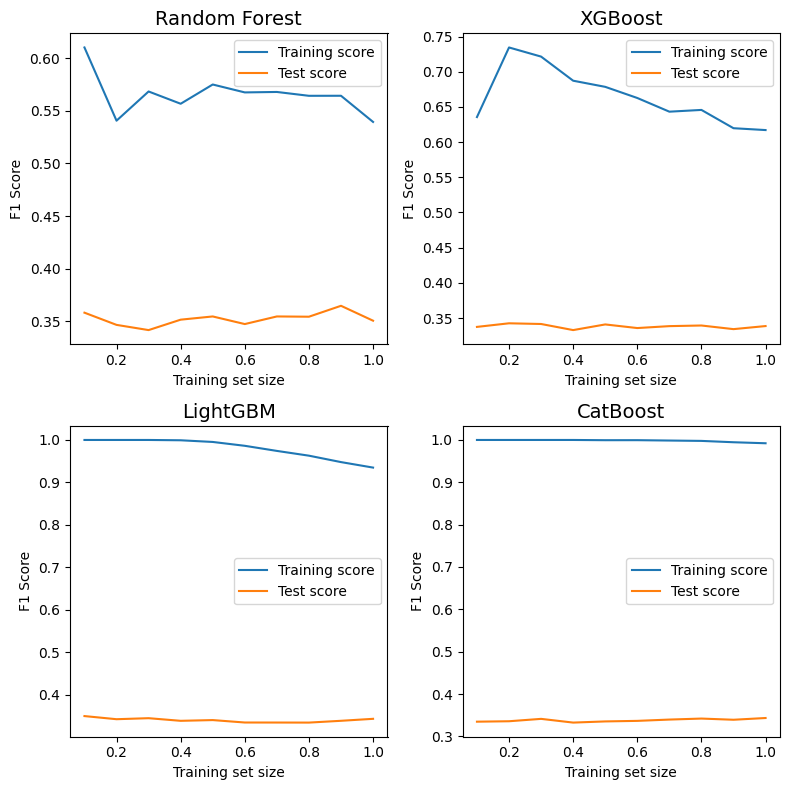

In [149]:
models = {
    'Random Forest': best_pipeline_forest,
    'XGBoost': best_pipeline_xgb,
    'LightGBM': best_pipeline_lgb,
    'CatBoost': best_pipeline_cat,
}

fig, axes = plt.subplots(2, 2, figsize=(8, 8))
axes = axes.flatten()

train_sizes = np.linspace(0.1, 1.0, 10)

for idx, (name, model) in enumerate(models.items()):
    ax = axes[idx]

    train_sizes_, train_scores, val_scores = learning_curve(
        estimator=model,
        X=X_train,
        y=y_train,
        train_sizes=train_sizes,
        cv=5,
        scoring='f1_macro',
        n_jobs=-1
    )

    ax.plot(train_sizes, train_scores.mean(axis=1), label="Training score")
    ax.plot(train_sizes, val_scores.mean(axis=1), label="Test score")
    ax.set_title(name, fontsize=14)
    ax.set_xlabel("Training set size")
    ax.set_ylabel("F1 Score")
    ax.legend()

plt.tight_layout()
plt.show()

### 📝 Model evaluation
- **Random Forest**
  - aaa
- **XGBoost**
  - aaa
- **LightGBM**
  - aaa
- **CatBoost**
  - aaa

---

## Improve models with feature engineering

### Feature engineering ideas
- Day
  - `is_weekend`
  - `day_period`（morning/afternoon/evening/night)
- Time
  - `hour_bin`
  - `is_rush_hour`

- Weather


- How far from Hospital?
- Insurance?
- TODO: SUM by the region 



In [107]:
pass

### Feature importance

In [106]:
pass

---

In [ ]:
# with open('../models/project_accidents_model.pkl', 'wb') as f:
#     pickle.dump(pipe, f)

In [ ]:
# with open('../models/project_accidents_model.pkl', 'rb') as f:
#     model = pickle.load(f)